# Perkenalan

Dibuat Oleh Arry Pandowo, student Full Stack Data Science Batch 01 Hacktiv8 untuk pemenuhan Graded Challenge #04 Phase #01

> ### Data yang digunakan
Data yang digunakan adalah Credit Card Dataset for Clustering [dimari]('https://www.kaggle.com/arjunbhasin2013/ccdata') yang merupakan dataset pengguna kartu kredit aktif yang berjumlah lebih dari 9000 orang, data ini merupakan Dataset yang menceritakan tentang perilaku penggunaan selama 6 bulan berjalan yang memiliki 18 variable

> ### Tujuan yang ingin dicapai
<ol>
<li>melihat hubungan antar feature didalam data</li>
<li>membuat data clustering dengan K-Means dan Agglomerative Clustering </li>
<li>melakukan interpretasi atas data grafik yang dihasilkan dari proses data clustering yang dilakukan</li>
<ol/>

***

# Library

In [1]:
import pandas as pd
import numpy as np
import sklearn as sk
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.cluster import KMeans, AgglomerativeClustering
import matplotlib.cm as cm
from sklearn.metrics import silhouette_samples, silhouette_score

Seluruh library yang digunakan untuk melakukan proses analisis dan pengolahan data

***

# Data Loading

## Data Loading dan Informasi Dasar

In [2]:
df = pd.read_csv('CC GENERAL.csv')

informasi mengenai masing masing feature pada dataset sesuai dengan informasi yang ada pada tautan diatas adalah sebagai berikut :
* CUSTID : Identification of Credit Card holder (Categorical)
* BALANCE : Balance amount left in their account to make purchases (
* BALANCEFREQUENCY : How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)
* PURCHASES : Amount of purchases made from account
* ONEOFFPURCHASES : Maximum purchase amount done in one-go
* INSTALLMENTSPURCHASES : Amount of purchase done in installment
* CASHADVANCE : Cash in advance given by the user
* PURCHASESFREQUENCY : How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)
* ONEOFFPURCHASESFREQUENCY : How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)
* PURCHASESINSTALLMENTSFREQUENCY : How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)
* CASHADVANCEFREQUENCY : How frequently the cash in advance being paid
* CASHADVANCETRX : Number of Transactions made with "Cash in Advanced"
* PURCHASESTRX : Numbe of purchase transactions made
* CREDITLIMIT : Limit of Credit Card for user
* PAYMENTS : Amount of Payment done by user
* MINIMUM_PAYMENTS : Minimum amount of payments made by user
* PRCFULLPAYMENT : Percent of full payment paid by user
* TENURE : Tenure of credit card service for user

Data berikut akan digunakan sebagai dasar analisis data hubungan antar fitur didalam Eksplorasi Data

berdasarkan informasi diatas perlu dilakukan pemisahan antara data numerik dan categorical yang akan diperlukan pada proses PCA dimensional reduction

## Missing Value

In [3]:
df.isna().sum().reset_index()

,index,0
0,CUST_ID,0
1,BALANCE,0
2,BALANCE_FREQUENCY,0
3,PURCHASES,0
4,ONEOFF_PURCHASES,0
5,INSTALLMENTS_PURCHASES,0
6,CASH_ADVANCE,0
7,PURCHASES_FREQUENCY,0
8,ONEOFF_PURCHASES_FREQUENCY,0
9,PURCHASES_INSTALLMENTS_FREQUENCY,0


Terdapat missing value pada Minimum_Payments dan Credit limit, jumlah tidak signifikan jika dibandingkan total data, dipertimbangkan untuk di drop pada proses Data Cleaning

## Drop CUST_ID

In [4]:
df['CUST_ID'].value_counts()

C15094    1
C17018    1
C16619    1
C12700    1
C18487    1
         ..
C13890    1
C14822    1
C17992    1
C15914    1
C17893    1
Name: CUST_ID, Length: 8950, dtype: int64

In [5]:
df = df.drop(['CUST_ID'], axis=1)

Customer ID merupakan data unique per customer yang pada konteks klustering tidak dibutuhkan, maka diputuskan akan di drop diawal untuk mempermudah pengolahan data pada tahapan selanjutnya

## Skewness Score

In [6]:
for columns in df:
    print('Nilai Skewness ' + columns + ' adalah', df[columns].skew())

Nilai Skewness BALANCE adalah 2.393386042571806
Nilai Skewness BALANCE_FREQUENCY adalah -2.0232655185149078
Nilai Skewness PURCHASES adalah 8.144269064554651
Nilai Skewness ONEOFF_PURCHASES adalah 10.045082884700278
Nilai Skewness INSTALLMENTS_PURCHASES adalah 7.299119908745641
Nilai Skewness CASH_ADVANCE adalah 5.166609074074723
Nilai Skewness PURCHASES_FREQUENCY adalah 0.06016423585803591
Nilai Skewness ONEOFF_PURCHASES_FREQUENCY adalah 1.5356127835248519
Nilai Skewness PURCHASES_INSTALLMENTS_FREQUENCY adalah 0.5092011649999882
Nilai Skewness CASH_ADVANCE_FREQUENCY adalah 1.828686266477852
Nilai Skewness CASH_ADVANCE_TRX adalah 5.721298203192298
Nilai Skewness PURCHASES_TRX adalah 4.630655265932403
Nilai Skewness CREDIT_LIMIT adalah 1.5224640052886198
Nilai Skewness PAYMENTS adalah 5.907619794397562
Nilai Skewness MINIMUM_PAYMENTS adalah 13.622796994677456
Nilai Skewness PRC_FULL_PAYMENT adalah 1.942819940971858
Nilai Skewness TENURE adalah -2.9430172876199134


Terdapat banyak data yang memiliki Nilai Skewness yang tinggi, akan dilakukan analisis lebih lanjut pada Data Preprosessing

***

# Data Cleaning

Drop Data NA, dikarenakan presentase data NA yang sedikit apabila dibandingkan dengan proporsi data, maka diputuskan data NA didrop saja

In [7]:
df.dropna(inplace=True)

In [8]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000
mean,1601.224893,0.895035,1025.433874,604.901438,420.843533,994.175523,0.496000,0.205909,0.368820,0.137604,3.313918,15.033233,4522.091030,1784.478099,864.304943,0.159304,11.534391
std,2095.571300,0.207697,2167.107984,1684.307803,917.245182,2121.458303,0.401273,0.300054,0.398093,0.201791,6.912506,25.180468,3659.240379,2909.810090,2372.566350,0.296271,1.310984
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.049513,0.019163,0.000000,6.000000
25%,148.095189,0.909091,43.367500,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,418.559237,169.163545,0.000000,12.000000
50%,916.855459,1.000000,375.405000,44.995000,94.785000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,896.675701,312.452292,0.000000,12.000000
75%,2105.195853,1.000000,1145.980000,599.100000,484.147500,1132.385490,0.916667,0.333333,0.750000,0.250000,4.000000,18.000000,6500.000000,1951.142090,825.496463,0.166667,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8636 entries, 0 to 8949
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8636 non-null   float64
 1   BALANCE_FREQUENCY                 8636 non-null   float64
 2   PURCHASES                         8636 non-null   float64
 3   ONEOFF_PURCHASES                  8636 non-null   float64
 4   INSTALLMENTS_PURCHASES            8636 non-null   float64
 5   CASH_ADVANCE                      8636 non-null   float64
 6   PURCHASES_FREQUENCY               8636 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8636 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8636 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8636 non-null   float64
 10  CASH_ADVANCE_TRX                  8636 non-null   int64  
 11  PURCHASES_TRX                     8636 non-null   int64  
 12  CREDIT

Missing value telah di drop, Data siap dilakukan proses eksplorasi lebih lanjut

***

# Eksplorasi Data

## Feature Data Skewed

In [10]:
cols = list(df.columns)

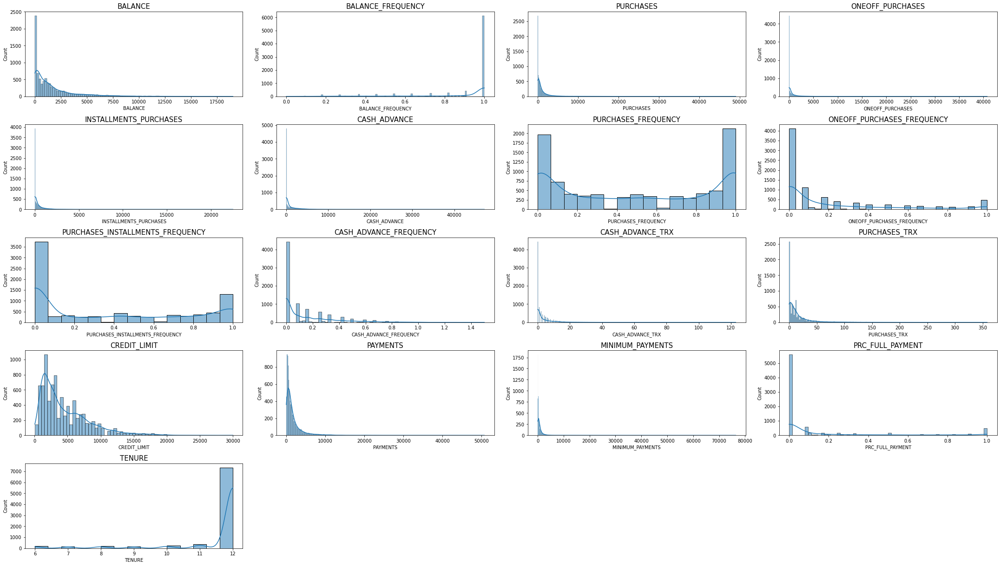

In [11]:
plt.figure(figsize = (30, 20))
for i in range(len(cols)):
    plt.subplot(len(cols)//3+1, 4, i + 1)
    sns.histplot(df[cols[i]], kde=True)
    plt.title(cols[i], fontsize = 15)
    
plt.tight_layout()
plt.show()

> K-means dan  clustering memiliki sensitivitas terhadap data outliers, outliers dapat menjadi sumber sehingga  terganggunya proses clustering data,  diperlukan tindakan terhadap data outliers yang akan dilakukan pada tahapan Data Preprocessing


# Data Preprocessing

## Outlier Treatment

In [12]:
irq_score = {}

for c in cols:
    q1 = df[c].quantile(0.25)
    q3 = df[c].quantile(0.75)
    score = q3 - q1
    outliers = df[(df[c] < q1 - 1.5 * score) | (df[c] > q3 + 1.5 * score)][c]
    values = df[(df[c] >= q1 - 1.5 * score) | (df[c] <= q3 + 1.5 * score)][c]
    
    irq_score[c] = {
    
        "IQR": score,
        "n_outliers": outliers.count(),
        "outliers_avg": outliers.mean(),
        "outliers_stdev": outliers.std(),
        "outliers_median": outliers.median(),
        "values_avg:": values.mean(),
        "values_stdev": values.std(),
        "values_median": values.median(),
    }
    
irq_score = pd.DataFrame.from_dict(irq_score, orient='index')

irq_score

,IQR,n_outliers,outliers_avg,outliers_stdev,outliers_median,values_avg:,values_stdev,values_median
BALANCE,1957.100664,666,7262.349773,2199.165634,6644.515441,1601.224893,2095.571300,916.855459
BALANCE_FREQUENCY,0.090909,1511,0.486702,0.182931,0.545455,0.895035,0.207697,1.000000
PURCHASES,1102.612500,768,5801.764987,4816.777980,4343.250000,1025.433874,2167.107984,375.405000
ONEOFF_PURCHASES,599.100000,961,3645.239168,3747.429069,2533.500000,604.901438,1684.307803,44.995000
INSTALLMENTS_PURCHASES,484.147500,811,2441.353416,1895.563419,1852.930000,420.843533,917.245182,94.785000
CASH_ADVANCE,1132.385490,977,5560.375436,3518.989567,4422.783845,994.175523,2121.458303,0.000000
PURCHASES_FREQUENCY,0.833334,0,NaN,NaN,NaN,0.496000,0.401273,0.500000
ONEOFF_PURCHASES_FREQUENCY,0.333333,749,0.955502,0.062714,1.000000,0.205909,0.300054,0.083333
PURCHASES_INSTALLMENTS_FREQUENCY,0.750000,0,NaN,NaN,NaN,0.368820,0.398093,0.166667
CASH_ADVANCE_FREQUENCY,0.250000,341,0.776864,0.125187,0.750000,0.137604,0.201791,0.000000


> Dapat terlihat total outliers pada masaing masing feature, diperlukan tindakan pada nilai outliers tersebut, diputuskan data outliers untuk di drop agar menghasilkan hasil clustering yang lebih maksimal

In [13]:
max_thresold_BALANCE=df["BALANCE"].quantile(0.95)
min_thresold_BALANCE=df["BALANCE"].quantile(0.05)
max_thresold_CREDIT_LIMIT=df["CREDIT_LIMIT"].quantile(0.95)
min_thresold_CREDIT_LIMIT=df["CREDIT_LIMIT"].quantile(0.05)
max_thresold_PAYMENTS=df["PAYMENTS"].quantile(0.95)
min_thresold_PAYMENTS=df["PAYMENTS"].quantile(0.05)
df_no_outlier=df[(df["CREDIT_LIMIT"] < max_thresold_CREDIT_LIMIT) & (df["CREDIT_LIMIT"] > min_thresold_CREDIT_LIMIT) & (df["BALANCE"] < max_thresold_BALANCE) & (df["BALANCE"] > min_thresold_BALANCE) &  (df["PAYMENTS"] < max_thresold_PAYMENTS) & (df["PAYMENTS"] > min_thresold_PAYMENTS)]

dilakukan sort data dan drop data apabila data pada masing masing feature melewati batas maksimal dan minimum threshold pada masing masing feature, dengan maksimum threshold berada pada quantile 95% dan minimun threshold berada pada quantile 5% 

In [14]:
df_no_outlier.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6265 entries, 1 to 8938
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           6265 non-null   float64
 1   BALANCE_FREQUENCY                 6265 non-null   float64
 2   PURCHASES                         6265 non-null   float64
 3   ONEOFF_PURCHASES                  6265 non-null   float64
 4   INSTALLMENTS_PURCHASES            6265 non-null   float64
 5   CASH_ADVANCE                      6265 non-null   float64
 6   PURCHASES_FREQUENCY               6265 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        6265 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  6265 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            6265 non-null   float64
 10  CASH_ADVANCE_TRX                  6265 non-null   int64  
 11  PURCHASES_TRX                     6265 non-null   int64  
 12  CREDIT

> Tersisa 6265 entry data pada df_no_outlier yang akan digunakan pada proses clustering

## Variance Influence Factor

In [15]:
vif_data = pd.DataFrame()
vif_data["feature"] = df_no_outlier.columns
vif_data["VIF"] = [variance_inflation_factor(df_no_outlier.values, i) for i in range(len(df_no_outlier.columns))]
vif_data

,feature,VIF
0,BALANCE,4.445347
1,BALANCE_FREQUENCY,35.333296
2,PURCHASES,23159.218368
3,ONEOFF_PURCHASES,11191.510314
4,INSTALLMENTS_PURCHASES,5666.475380
5,CASH_ADVANCE,3.142475
6,PURCHASES_FREQUENCY,26.167583
7,ONEOFF_PURCHASES_FREQUENCY,6.801953
8,PURCHASES_INSTALLMENTS_FREQUENCY,17.106420
9,CASH_ADVANCE_FREQUENCY,5.508824


* Untuk data yang memiliki skor Variance Influence Factor (VIF) rendah (dibawah 5) tidak dimasukkan kedalam proses reduksi dimensi dikarenakan tidak memiliki hubungan multikolinearity sehingga feature tersebut. Data dinilai telah cukup independen untuk dimasukkan kedalam model. 
* Data yang merupakan kategorik dalam bentuk numerik ( BALANCEFREQUENCY, PURCHASESFREQUENCY, ONEOFFPURCHASESFREQUENCY , PURCHASESINSTALLMENTSFREQUENCY ) juga tidak dimasukkan kedalam proses perhitungan dimensional reduction

***

## Principal component analysis (PCA)

untuk feature yang memiliki Skor VIF diatas 5 maka akan digabungkan kedalam Feature baru dan direduksi dimensinya sehingga diharapkan proses klustering berjalan lebih maksimal

In [16]:
df_PCA = df_no_outlier[['PURCHASES', 'INSTALLMENTS_PURCHASES', 'TENURE', 'CASH_ADVANCE_FREQUENCY']]

### Standard Scalling

In [17]:
# scale the DataFrame
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
df_PCA_scalled=scaler.fit_transform(df_PCA)

* Untuk mempermudah model melakukan proses learning maka dilakukan scalling pada feature yang akan dilakukan proses dimentional reduction

### Dimention Reduction untuk df_PCA

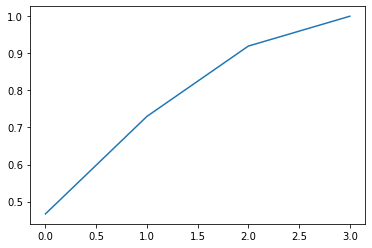

In [18]:
from sklearn.decomposition import PCA
pca=PCA(whiten=True)
pca.fit(df_PCA_scalled)
cumsum = np.cumsum(pca.explained_variance_ratio_)

plt.figure()
plt.plot(cumsum)

In [19]:
np.sum(pca.explained_variance_ratio_)

1.0

In [20]:
cumsum

array([0.46679826, 0.72972343, 0.9195152 , 1.        ])

* berdasarkan grafik diatas maka diambil patahan dengan 2 komponen dengan tingkat informasi data yang di keep sebesar 91,95%
* diambilnya n_components 2 mempertimbangkan kompleksitas dari grafik sehingga tidak mempersulit saat melakukan identifikasi yang diperlukan

### Transform df_PCA ke df_PCA_Final

,num1,num2
0,-0.968820,-0.373982
1,-0.051590,-0.785111
2,-0.446094,-0.973370
3,1.550861,-0.011626
4,0.201627,-0.661399


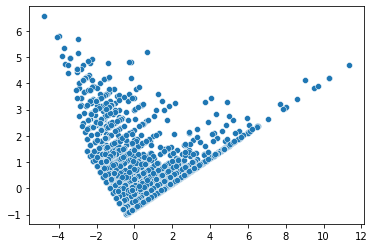

In [21]:
X2D=PCA(n_components=2).fit_transform(df_PCA_scalled)
sns.scatterplot(x=X2D[:,0],y=X2D[:,1])
df_PCA_final=pd.DataFrame(data=X2D,columns=["num1","num2"])
df_PCA_final.head()

didapat 2 feature baru dengan sebaran data sebagai berikut, untuk menggantikan feature numerik sebagai bentuk dimentional reduction dari PCA

In [22]:
df_PCA_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6265 entries, 0 to 6264
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   num1    6265 non-null   float64
 1   num2    6265 non-null   float64
dtypes: float64(2)
memory usage: 98.0 KB


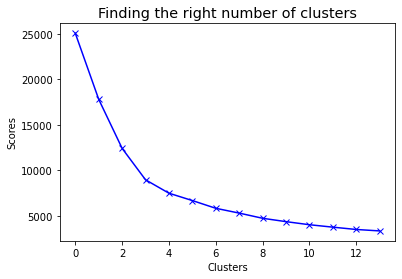

In [23]:
scores_1 = []

range_values = range(1,15)
for i in range_values:
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(df_PCA_scalled)
    scores_1.append(kmeans.inertia_)
plt.plot(scores_1, 'bx-')
plt.style.use('ggplot')
plt.title('Finding the right number of clusters')
plt.xlabel('Clusters')
plt.ylabel('Scores') 
plt.show()

## Penggabungan Feature & feature PCA

In [24]:
df_no_outlier.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6265 entries, 1 to 8938
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           6265 non-null   float64
 1   BALANCE_FREQUENCY                 6265 non-null   float64
 2   PURCHASES                         6265 non-null   float64
 3   ONEOFF_PURCHASES                  6265 non-null   float64
 4   INSTALLMENTS_PURCHASES            6265 non-null   float64
 5   CASH_ADVANCE                      6265 non-null   float64
 6   PURCHASES_FREQUENCY               6265 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        6265 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  6265 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            6265 non-null   float64
 10  CASH_ADVANCE_TRX                  6265 non-null   int64  
 11  PURCHASES_TRX                     6265 non-null   int64  
 12  CREDIT

In [25]:
df_PCA.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6265 entries, 1 to 8938
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   PURCHASES               6265 non-null   float64
 1   INSTALLMENTS_PURCHASES  6265 non-null   float64
 2   TENURE                  6265 non-null   int64  
 3   CASH_ADVANCE_FREQUENCY  6265 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 244.7 KB


In [26]:
df_no_outlier = df_no_outlier.drop(['PURCHASES', 'INSTALLMENTS_PURCHASES', 'TENURE', 'CASH_ADVANCE_FREQUENCY'], axis=1)

In [27]:
df_no_outlier.reset_index(drop=True, inplace=True)

In [28]:
df_PCA_final.reset_index(drop=True, inplace=True)

Reset index untuk menghindari timbulnya Nan value dikarenakan penggabungan dengan pdconcat

In [29]:
df_no_outlier = pd.concat([df_no_outlier, df_PCA_final], axis=1)

## VIF Final

In [45]:
vif_data = pd.DataFrame()
vif_data["feature"] = df_no_outlier.columns
vif_data["VIF"] = [variance_inflation_factor(df_no_outlier.values, i) for i in range(len(df_no_outlier.columns))]
vif_data

,feature,VIF
0,BALANCE,4.280598
1,BALANCE_FREQUENCY,8.374965
2,ONEOFF_PURCHASES,3.476258
3,CASH_ADVANCE,3.250640
4,PURCHASES_FREQUENCY,29.370573
5,ONEOFF_PURCHASES_FREQUENCY,6.709565
6,PURCHASES_INSTALLMENTS_FREQUENCY,17.148398
7,CASH_ADVANCE_TRX,2.509030
8,PURCHASES_TRX,4.374646
9,CREDIT_LIMIT,4.681982


> Dengan mempertimbangkan kelengkapan informasi, BALANCE_FREQUENCY, PURCHASES_FREQUENCY dan PURCHASES_INSTALLMENTS_FREQUENCY tetao dimasukan kedalam feature walaupun memiliki skor multikolinearity yang tinggi

# Pendefinisian Model

## KMEANS

In [30]:
model = KMeans(n_clusters=2, random_state=42)

In [32]:
df_no_outlier1 = scaler.fit_transform(df_no_outlier)

In [33]:
model.fit(df_no_outlier1)

KMeans(n_clusters=2, random_state=42)

Text(0, 0.5, 'Inertia')

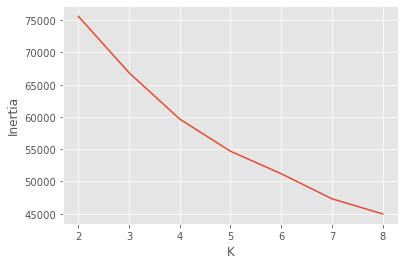

In [34]:
K=[2,3,4,5,6,7,8]
inertia=[KMeans(n_clusters=i).fit(df_no_outlier1).inertia_ for i in K]
plt.plot(K,inertia)
plt.xlabel('K')
plt.ylabel('Inertia')

In [ ]:
silhoutte =[silhouette_score(X2D, KMeans(n_clusters=i).fit(X2D).labels_) for i in K]
plt.plot(K,silhoutte)
plt.xlabel('K')
plt.ylabel('Silhouette Score')

In [36]:
def plot_silhouette(range_n_clusters,X):
    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=10)
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                        s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')

For n_clusters = 2 The average silhouette_score is : 0.5322280470033818
For n_clusters = 3 The average silhouette_score is : 0.5772987075228886
For n_clusters = 4 The average silhouette_score is : 0.4918737872948817
For n_clusters = 5 The average silhouette_score is : 0.4682677827189636
For n_clusters = 6 The average silhouette_score is : 0.4590585668969034
For n_clusters = 7 The average silhouette_score is : 0.438076760348711
For n_clusters = 8 The average silhouette_score is : 0.43347731286441055


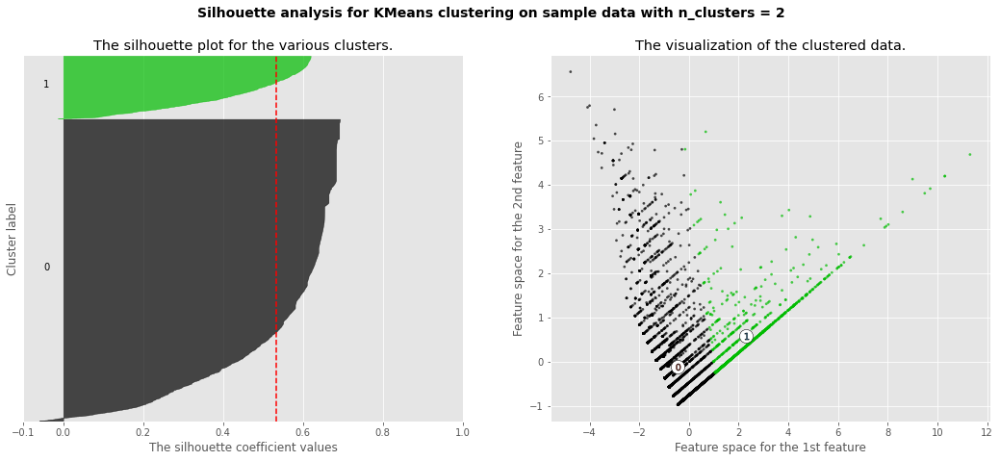

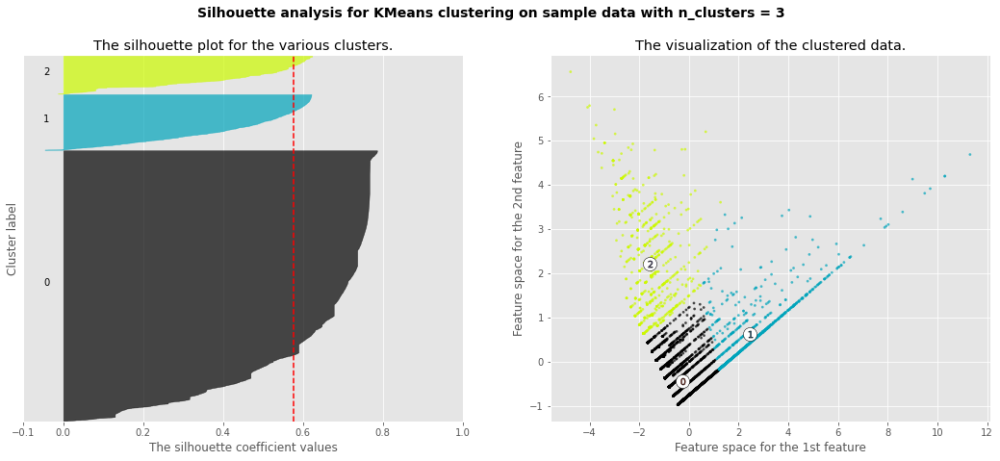

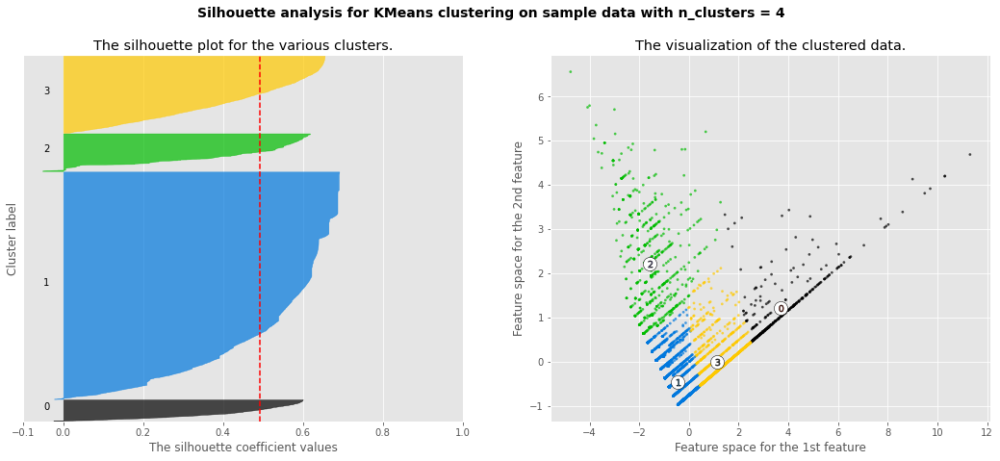

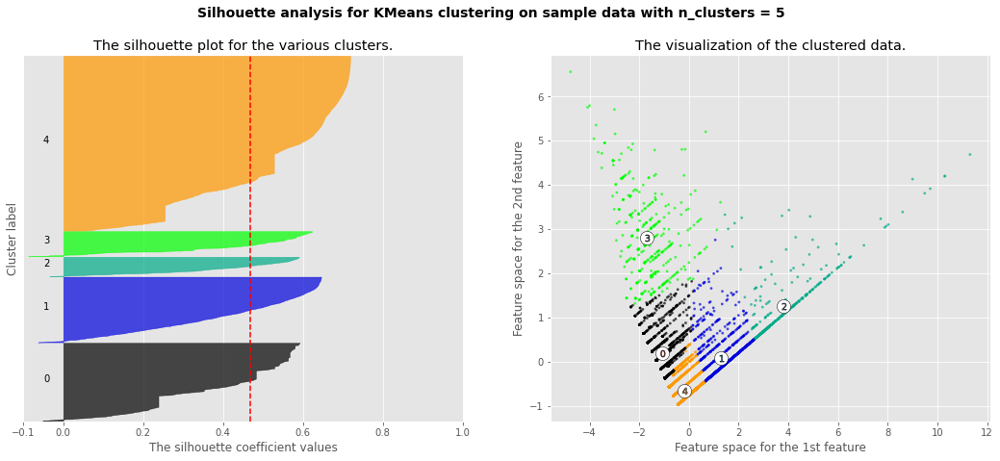

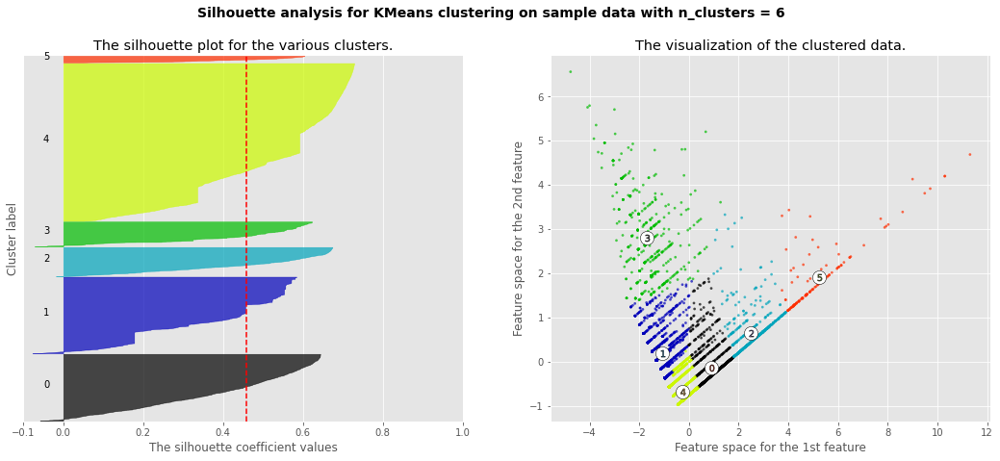

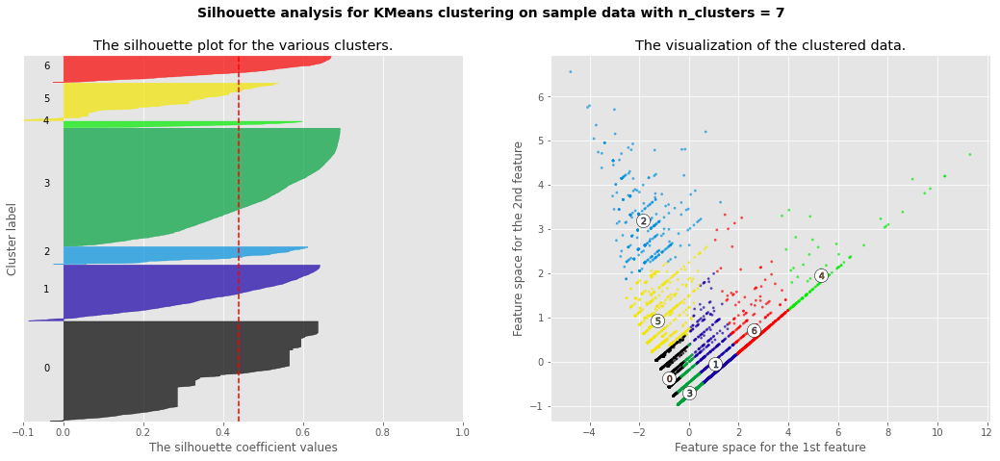

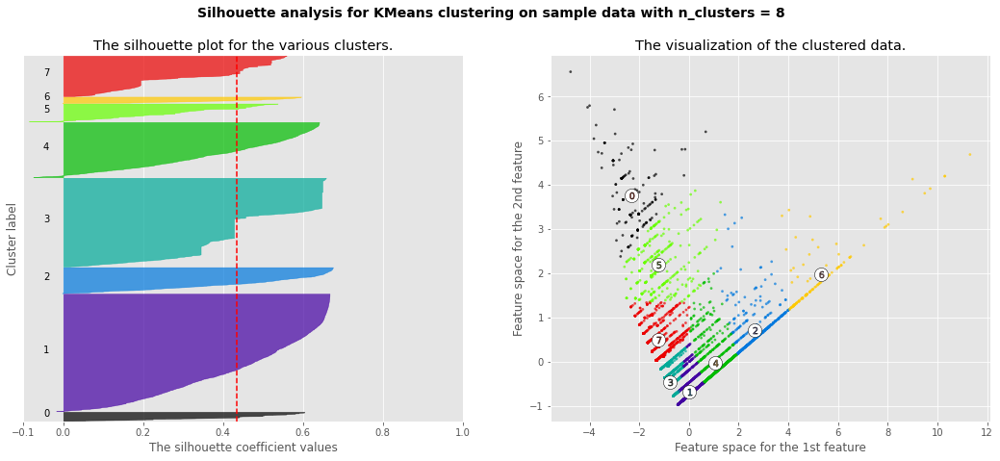

In [37]:
plot_silhouette(K,X2D)

Yang terpilih adalah n_components 3 dengan skor silhouete 0,57,7

## Aglomerative Clustering

In [38]:
agglo =AgglomerativeClustering(linkage="ward", n_clusters=3).fit(X2D) 

> Model Linkage ward dipilih untuk proses Agglomerative clustering dikarenakan criterrion ini memiliki algoritma yang "mempunish" proses merge, sehingga kluster seharusnya lebih berjarak dikarenakan ward meminimalisir variance antar titik

Text(0.5, 1.0, 'WARD')

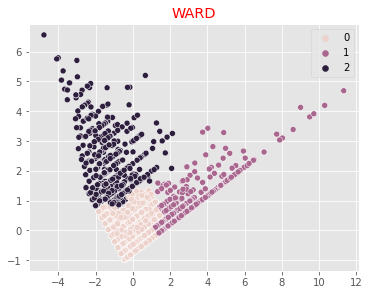

In [39]:
plt.figure(figsize=(13,10))
plt.subplot(2,2,1)
sns.scatterplot(x=X2D[:,0],y=X2D[:,1],hue=agglo.labels_)
plt.title("WARD", color='red')

> Hasil dari aglomerative clustering dinilai cukup baik dengan jarak antar kelompok sudah terbentuk dengan jelas 

# Model Inference

In [40]:
df_no_outlier.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6265 entries, 0 to 6264
Data columns (total 15 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           6265 non-null   float64
 1   BALANCE_FREQUENCY                 6265 non-null   float64
 2   ONEOFF_PURCHASES                  6265 non-null   float64
 3   CASH_ADVANCE                      6265 non-null   float64
 4   PURCHASES_FREQUENCY               6265 non-null   float64
 5   ONEOFF_PURCHASES_FREQUENCY        6265 non-null   float64
 6   PURCHASES_INSTALLMENTS_FREQUENCY  6265 non-null   float64
 7   CASH_ADVANCE_TRX                  6265 non-null   int64  
 8   PURCHASES_TRX                     6265 non-null   int64  
 9   CREDIT_LIMIT                      6265 non-null   float64
 10  PAYMENTS                          6265 non-null   float64
 11  MINIMUM_PAYMENTS                  6265 non-null   float64
 12  PRC_FU

In [41]:
df_no_outlier['Cluster'] = model.labels_

In [42]:
df_no_outlier['Cluster'].value_counts()

0    3615
1    2650
Name: Cluster, dtype: int64

In [43]:
df_no_outlier['Cluster'].unique()

array([0, 1])

In [44]:
df_no_outlier.head()

,BALANCE,BALANCE_FREQUENCY,ONEOFF_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,num1,num2,Cluster
0,3202.467416,0.909091,0.00,6442.945483,0.000000,0.000000,0.000000,4,0,7000.0,4103.032597,1072.340217,0.222222,-0.968820,-0.373982,0
1,2495.148862,1.000000,773.17,0.000000,1.000000,1.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,-0.051590,-0.785111,1
2,817.714335,1.000000,16.00,0.000000,0.083333,0.083333,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,-0.446094,-0.973370,0
3,1809.828751,1.000000,0.00,0.000000,0.666667,0.000000,0.583333,0,8,1800.0,1400.057770,2407.246035,0.000000,1.550861,-0.011626,1
4,1823.652743,1.000000,0.00,0.000000,1.000000,0.000000,1.000000,0,12,2300.0,679.065082,532.033990,0.000000,0.201627,-0.661399,1


# Kesimpulan

> Hasil model clustering K-Mean diatas telah berhasil memisahkan cluster cukup dengan n_components berada pada skor 3 untuk mencapai skor sihouete tertinggi. 

> Skor Silhouette yang tingg memberikan makna bahwa masing masing cluster telah terpisah dengan baik

